In [26]:
%load_ext autoreload
%autoreload 2

import pathlib
import os
import sys
import cv2 as cv
import numpy as np 

sys.path.append("..")
from src import ImageLoader, LIP, ImageProcessor

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [1]:
import cv2
import urllib.request as urllib
import numpy as np

from urllib.request import Request, urlopen


url = f"https://www.missionjuno.swri.edu/Vault/VaultOutput?VaultID=44584&ts=1667309355"

req = Request(
url= url, 
headers={'User-Agent': 'Mozilla/5.0'}
)

webpage = urlopen(req).read()
arr = np.asarray(bytearray(webpage), dtype=np.uint8)

In [8]:
arr

array([137,  80,  78, ...,  66,  96, 130], dtype=uint8)

In [181]:
img = ImageLoader(id= '44584&ts=1667309355').load()

In [27]:
img = ImageProcessor(id= '41266&ts=1656511106').enhance(denoising=False, window = 70, clipLimit=15)

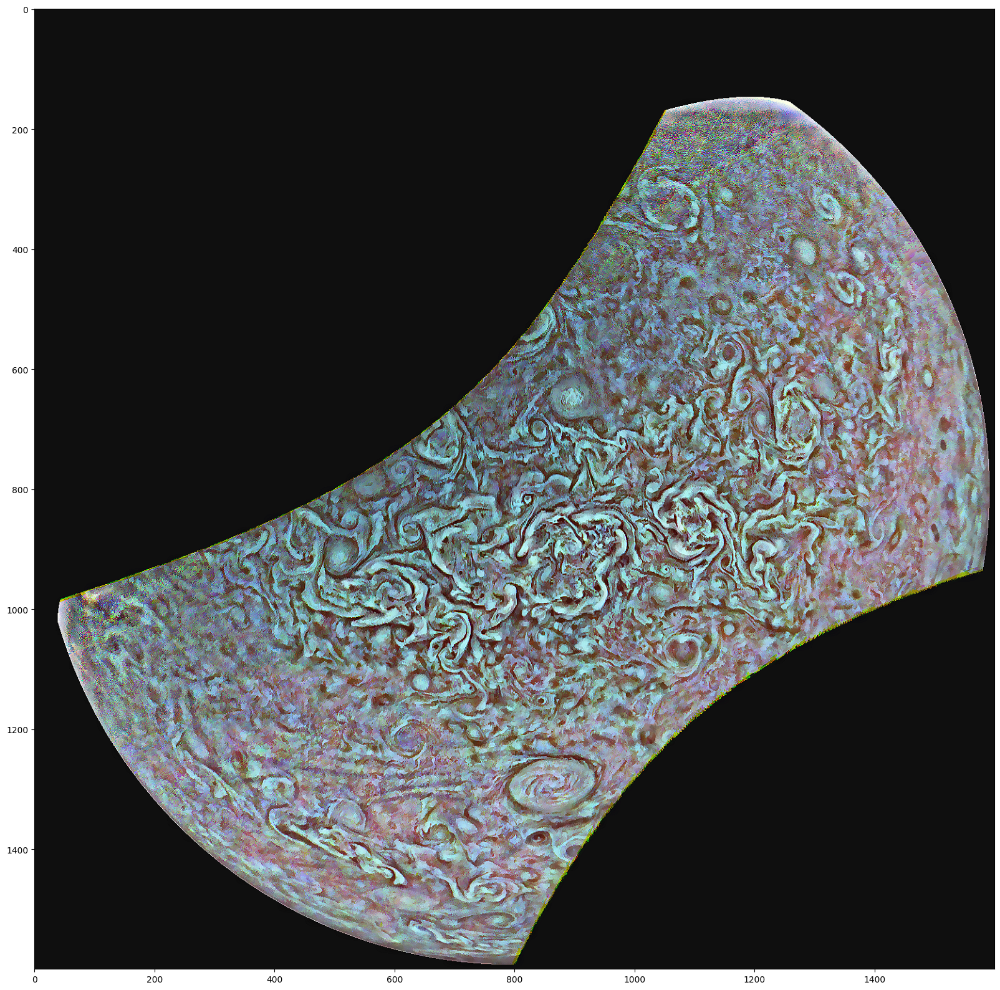

In [28]:
import matplotlib.pyplot as plt 
plt.figure(figsize = (20,20 ))


plt.imshow(img)

In [177]:
def adaptative_histogram_eq(img, clipLimit = 5.0, window = 5, denoising = True, sharpen=True):
    

    sharpen_kernel = np.array([[0, -1, 0],
                    [-1, 5, -1],
                    [0, -1, 0]])

    
    clahe = cv.createCLAHE(clipLimit = clipLimit, tileGridSize = (window, window))

    img_result = np.zeros(img.shape)

    img_result[:,:,0] = clahe.apply(img[:,:,0])
    img_result[:,:,1] = clahe.apply(img[:,:,1])
    img_result[:,:,2] = clahe.apply(img[:,:,2])


    #img_result = median_filter(img_result.astype('uint8'), 3)
    img_result = img_result.astype("uint8")
    img_result= cv.bilateralFilter(img_result, 3, 51, 51)
    
    if denoising :
        img_result = cv.fastNlMeansDenoisingColored(img_result, None, 3, 3)
    if sharpen :
        img_result[:,:,2] = cv.filter2D(src=img_result[:,:,2], ddepth=-1, kernel=sharpen_kernel)
    return img_result

In [182]:
img_result = adaptative_histogram_eq(img, clipLimit = 10.0, window=50, denoising=False, sharpen=True)

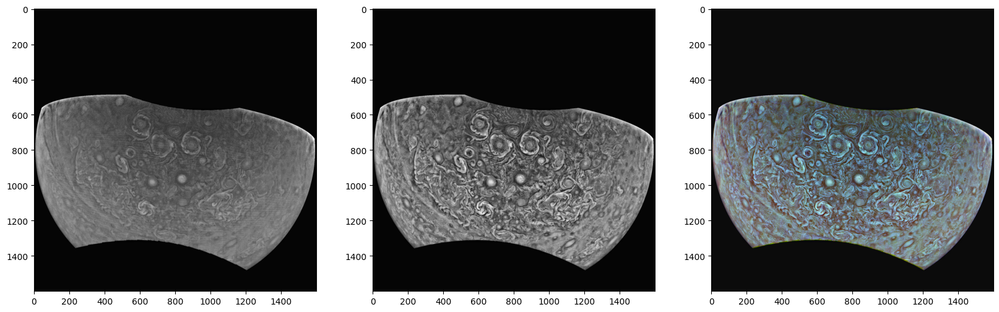

In [183]:
fig = plt.figure(figsize=(20,20))
axs = fig.subplots(1,3)

for i in range(3):
    axs[i].imshow(img_result[:,:,i], cmap  = "gray")
cv.imwrite("test.png", img_result)

plt.imshow(img_result)

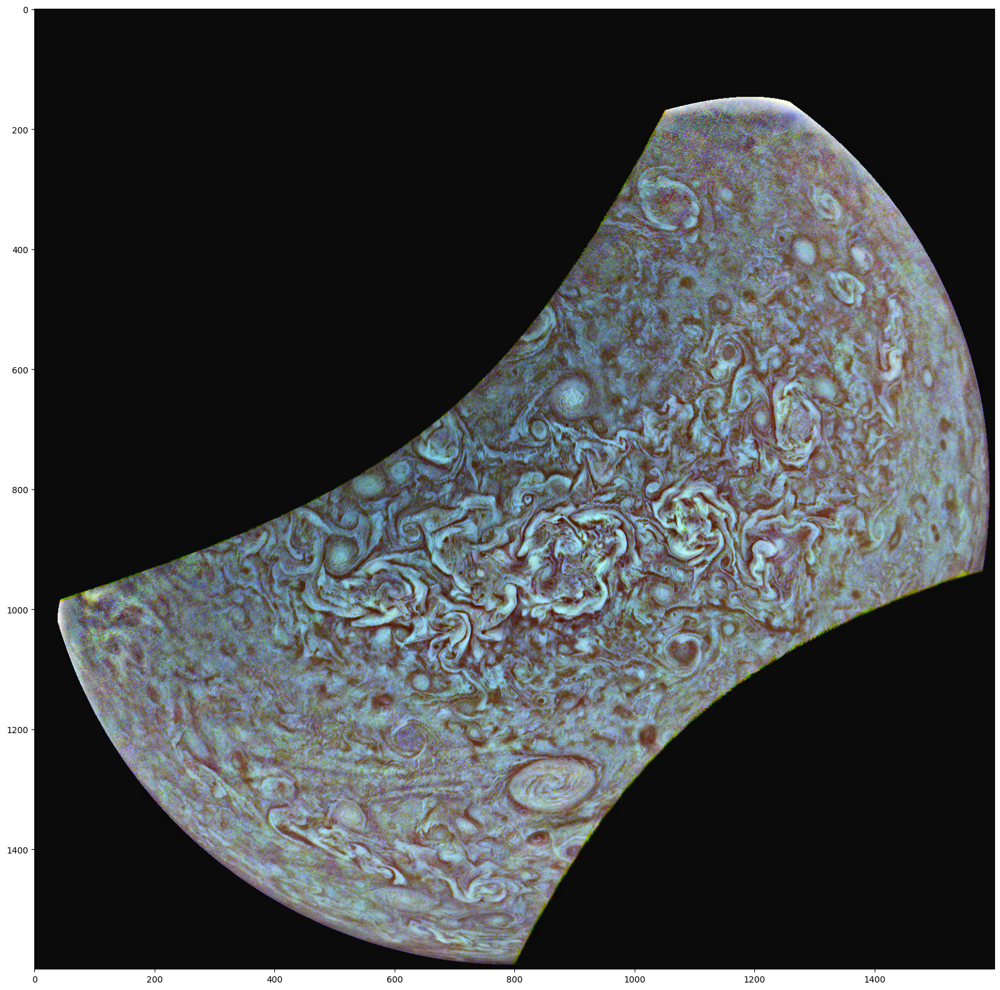

In [78]:
fig = plt.figure(figsize=(20,20))
plt.imshow(img_result, cmap = 'gray')

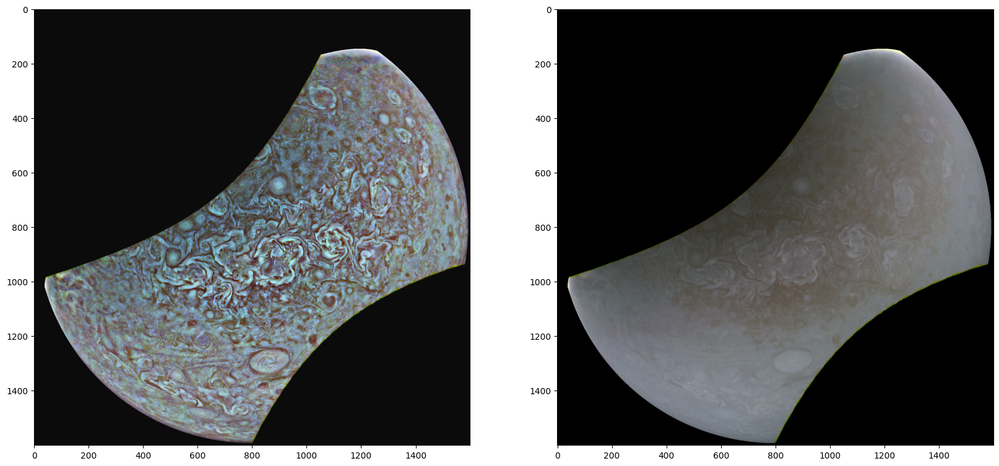

In [122]:
fig = plt.figure(figsize=(20,20))
axs = fig.subplots(1,2)
axs[0].imshow(img_result)
axs[1].imshow(img)

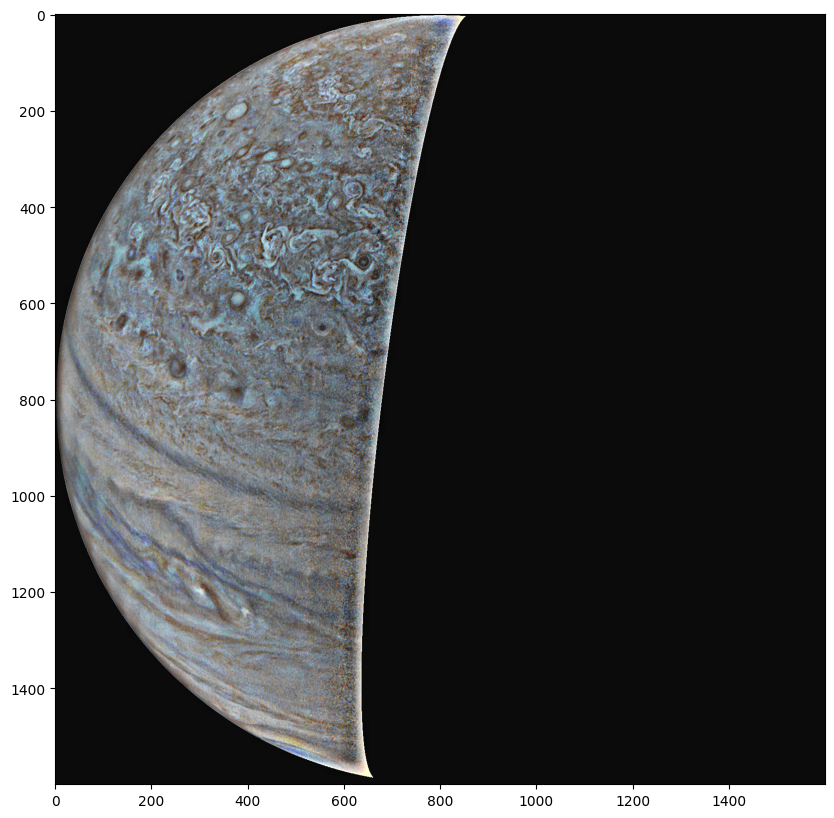

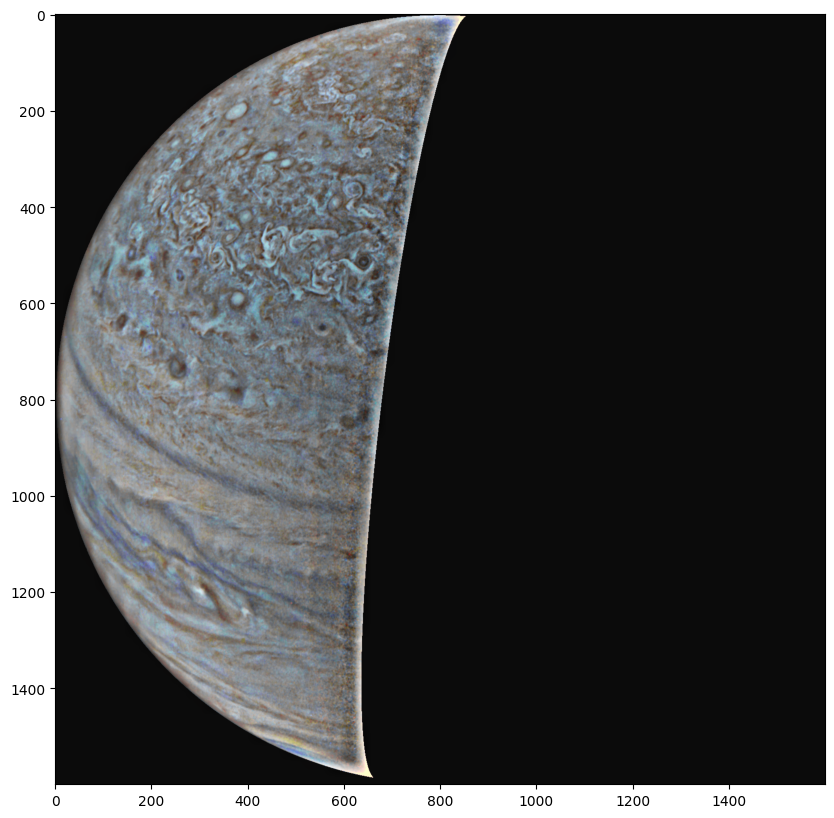

In [208]:
from scipy.signal import convolve

sharpen = np.array([[0, -1, 0],
                    [-1, 5, -1],
                    [0, -1, 0]])

identity = cv.filter2D(src=img_result, ddepth=-1, kernel=sharpen)

plt.figure(figsize=(10,10))
plt.imshow(identity, cmap = 'gray')

plt.figure(figsize=(10,10))
plt.imshow(img_result, cmap = 'gray')

In [9]:
img2 = adaptative_histogram_eq(img, clipLimit = 15.0, window=(100,100), denoising=True)

In [56]:
from scipy.ndimage import median_filter

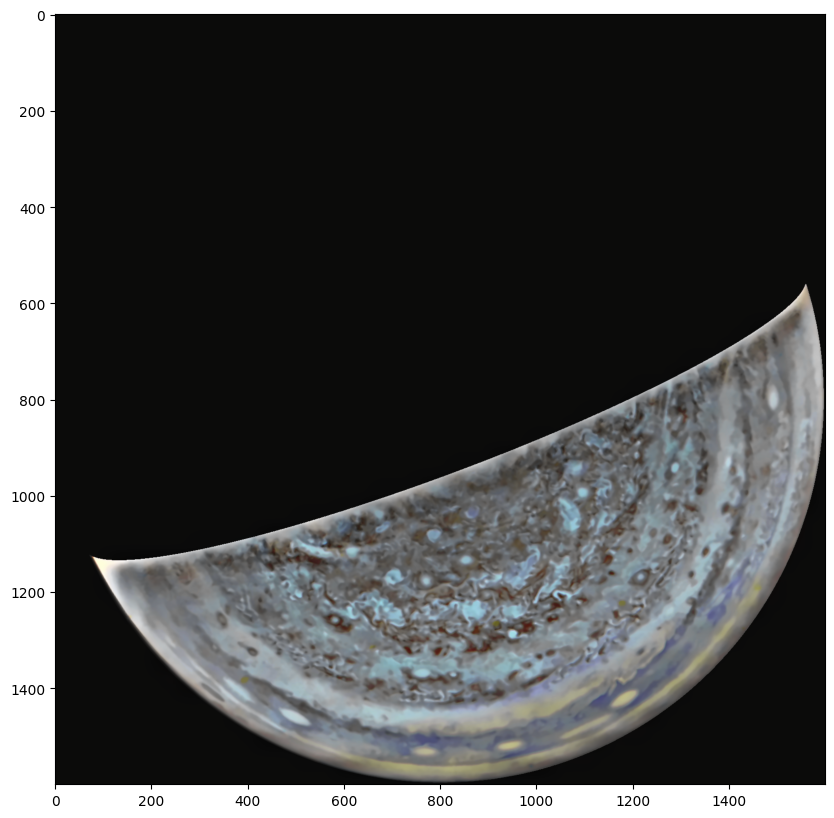

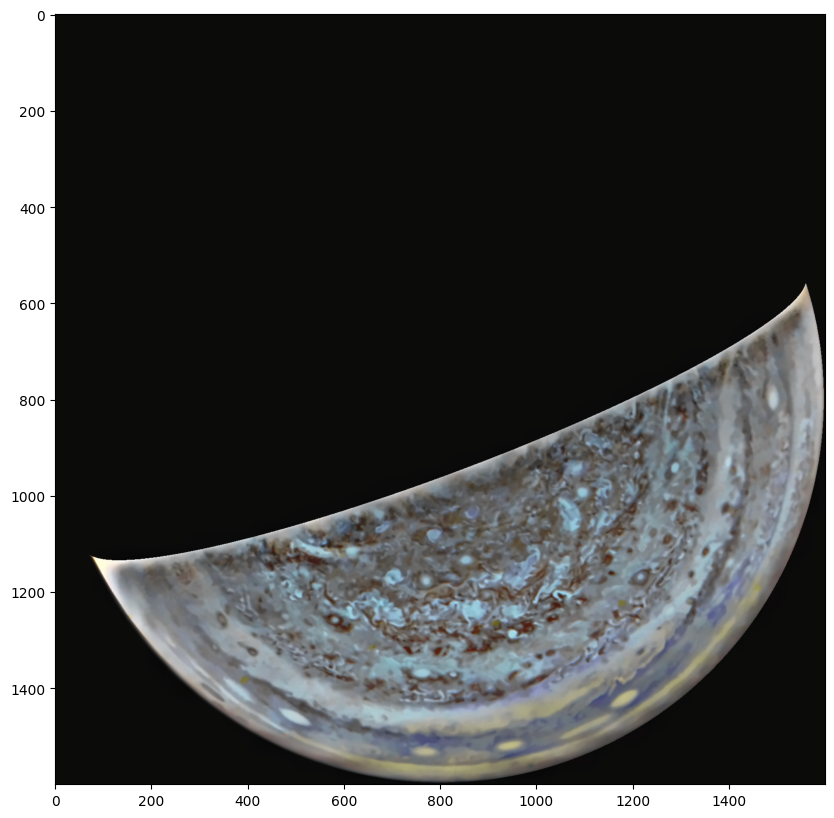

In [65]:
import matplotlib.pyplot as plt 

plt.figure(figsize=(10,10))
plt.imshow(median_filter(img_result, size = 3), cmap = "gray")

plt.figure(figsize=(10,10))
plt.imshow(img_result, cmap = "gray")

In [221]:
cv.imwrite("test15.png", img_result)


True

In [119]:
from sklearn.decomposition import FastICA
from sklearn.decomposition import PCA

ICA = FastICA(n_components = 3, max_iter=500)
ipca = ICA.fit_transform(img.reshape(-1, 3))

c:\Users\LENOVO\Desktop\JovianImageProcessing\BACKEND\env\lib\site-packages\sklearn\decomposition\_fastica.py:494: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


In [161]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4)
labels = kmeans.fit_predict(img_result.reshape(-1,3))

In [166]:
from skimage.color import label2rgb
i = 3

norm_image_labelise = label2rgb(labels.reshape(img.shape[:-1]) == i, image = img_result, alpha = 0.3, bg_label = labels[0])

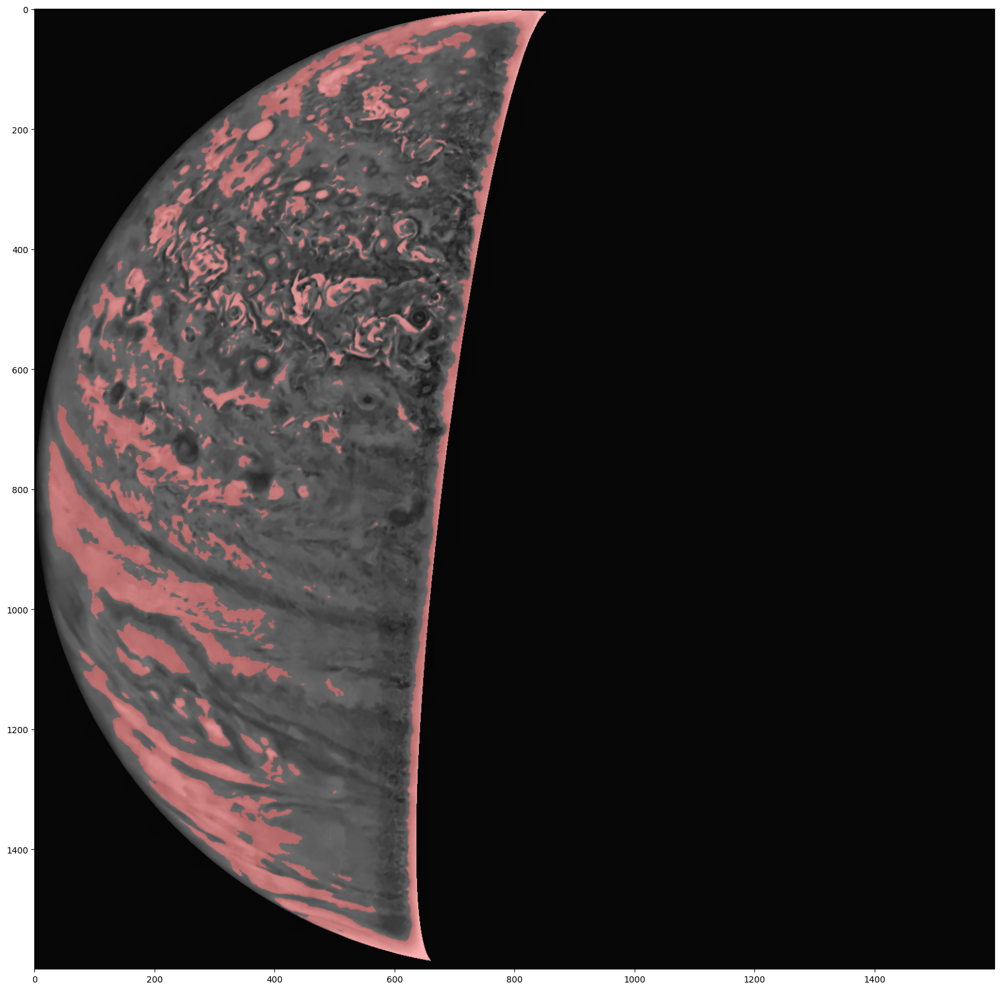

In [167]:
plt.figure(figsize = (20,20))
plt.imshow(norm_image_labelise)

In [120]:
pca = PCA(n_components=3)
pca_i = pca.fit_transform(img.reshape(-1, 3))

In [129]:
norm_image = cv.normalize(pca_i.reshape(img.shape)[:,:,2], None, alpha = 0, beta = 255, norm_type = cv.NORM_MINMAX, dtype = cv.CV_32F).astype('uint8')

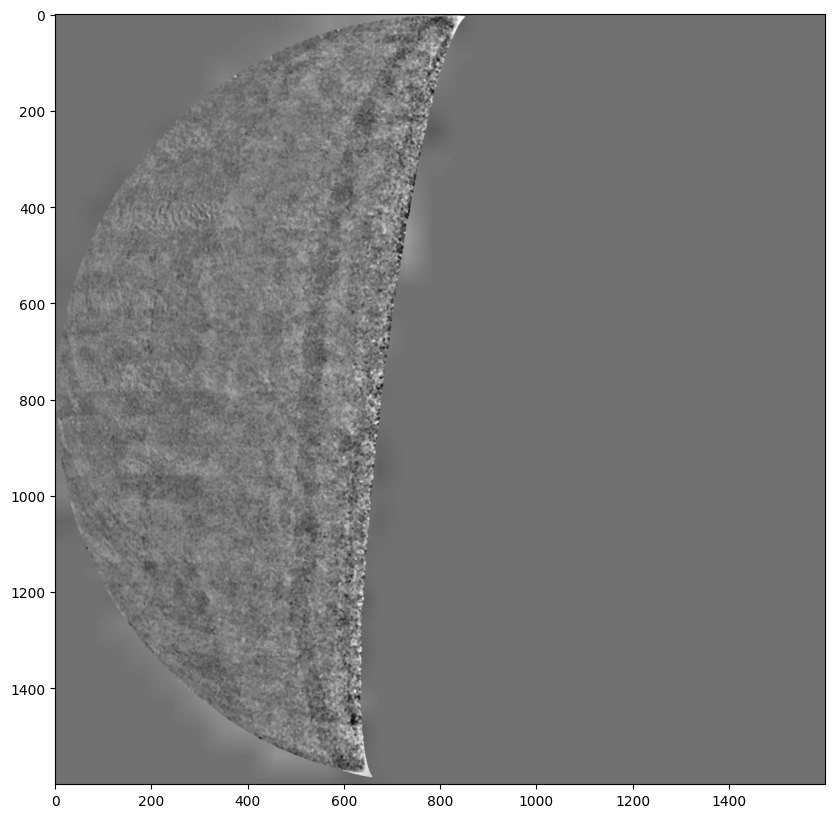

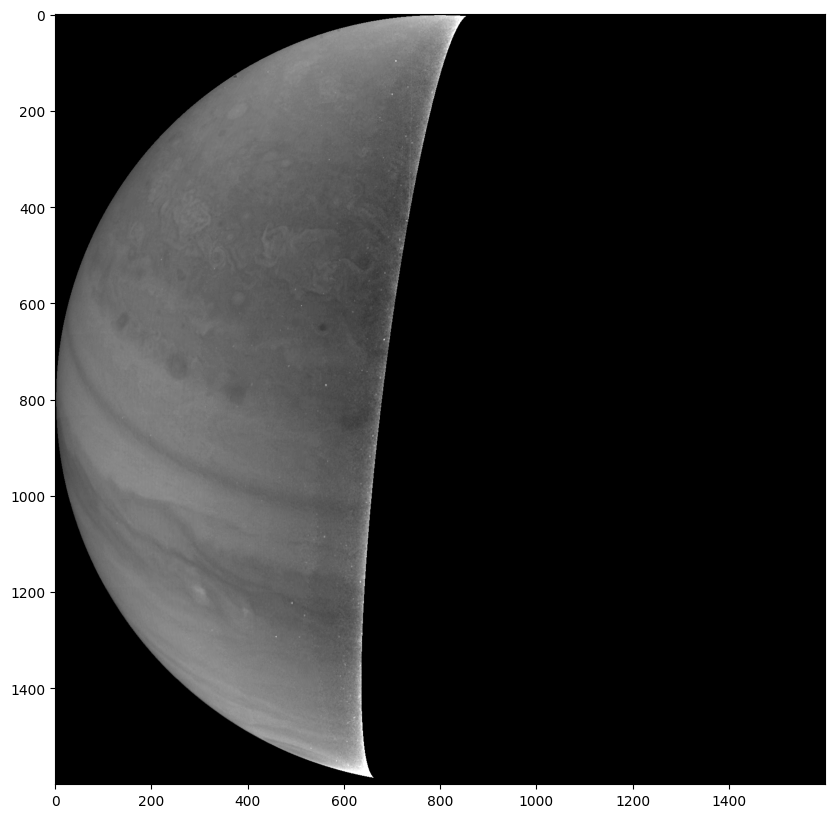

In [130]:
clahe = cv.createCLAHE(clipLimit = 5.0, tileGridSize = (30,30))
plt.figure(figsize = (10,10))
plt.imshow(median_filter(clahe.apply(norm_image), 5), cmap = "gray")
plt.figure(figsize = (10,10))
plt.imshow(img[:,:,0], cmap = "gray")